# Visualise: Heatmap: loss vs elevation and azimuth
### plot axes:
x: azimuth
y: elevation
z: loss

### received data columns:

0: src 1 pred elev

1: src 1 pred azim

2: src 2 pred elev

3: src 2 pred azim

4: src 1 target elev

5: src 1 target azim

6: src 2 target elev

7: src 2 target azim

8: loss 1

9: loss 2



In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import torch
import numpy as np


In [2]:
import warnings

def elevOffset(val):
    # if np.int((val + 45) / 15) == 9:
    #     print("Notice: elevation 90 degree received")
    return np.int((round(val) + 45) / 15)

def azimOffset(val):
    return np.int((round(val) / 15))
def sphericalWrap(val):
    val[val<0] += 360
    val[val>=360] -= 360

    val[:,0][val[:,0]>=270] -= 360
    val[:,0][np.logical_and(
        val[:,0]>=90,
        val[:,0]<270
    )] = 180 - val[:,0][np.logical_and(
        val[:,0]>=90,
        val[:,0]<270
    )]

def vis_heatmap(loss_array, fig_title=None):
    plt.figure(figsize=(12, 5), dpi=100)
    plt.imshow(loss_array, origin="lower", cmap='viridis')
    plt.colorbar()
    plt.xticks(range(loss_array.shape[1]),range(0,360,15))
    plt.yticks(range(loss_array.shape[0]),range(-45,90,15))
    plt.title(fig_title)
    plt.show()

def vis_line(loss_array, x_label: str, fig_title=None):
    plt.figure(figsize=(10, 4), dpi=100)
    plt.plot(loss_array, label='_nolegend_')
    if x_label.lower()[0] == "a":
        x_ticks = range(0,360,15)
    elif x_label.lower()[0] == "e":
        x_ticks = range(-45,90,15)
    plt.axhline(y=15, color='r', linestyle='--', label='Reference to location resolution')
    plt.legend(loc='upper right')
    plt.xticks(range(loss_array.size),x_ticks)
    plt.xlabel(x_label)
    plt.ylabel("Angle error")
    plt.grid()
    plt.title(fig_title)
    plt.show()

def vis_prediction(pred_array, target_arary, loss_array, fig_title=None):
    # marker_size = []
    # for i in loss_array:
    #     if i<=15:
    #         marker_size.append(40)
    #     elif i<=30:
    #         marker_size.append(80)
    #     elif i<=45:
    #         marker_size.append(120)
    #     elif i<=60:
    #         marker_size.append(160)
    #     else:
    #         marker_size.append(200)
    # marker_size = [i for i in loss_array]

    plt.figure(figsize=(12, 5), dpi=100)
    plt.scatter(pred_array[:,1], pred_array[:,0])
    plt.scatter(target_arary[:,1], target_arary[:,0], c='r')
    plt.legend(["predicted","target"])
    plt.xticks(range(0,360,15))
    plt.yticks(range(-45,90,15))
    plt.xlabel("Azimuth")
    plt.ylabel("Elevation")
    plt.grid()
    plt.title(fig_title)
    plt.show()


Text(0.5, 1.0, 'Angle error vs. elevation for the WGN-corrupted single sound source')

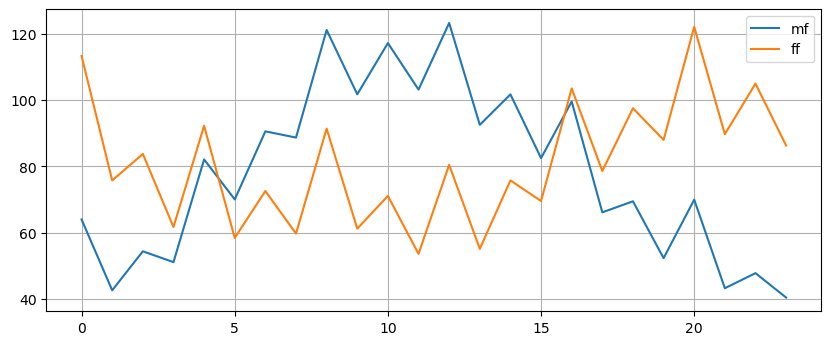

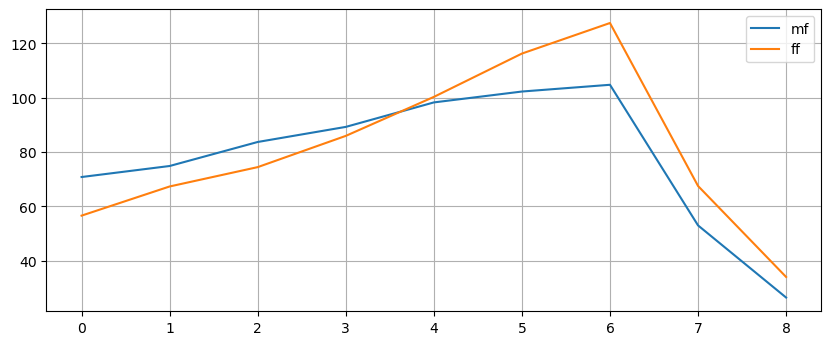

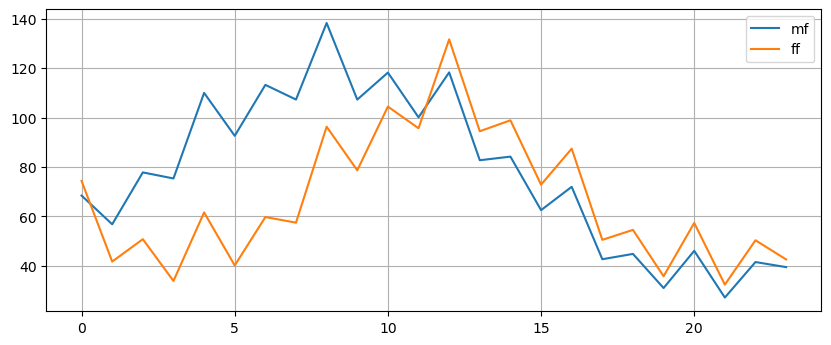

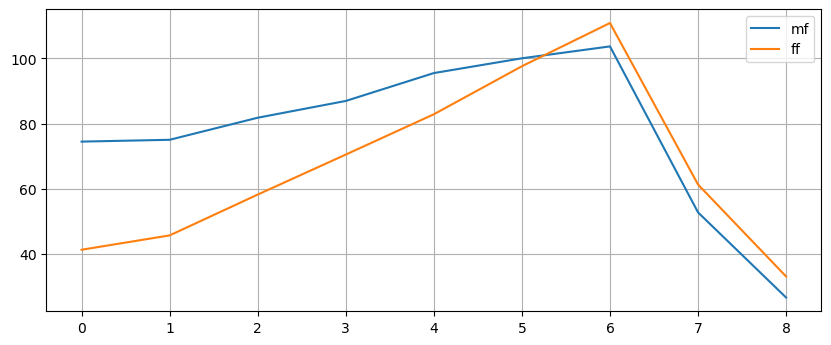

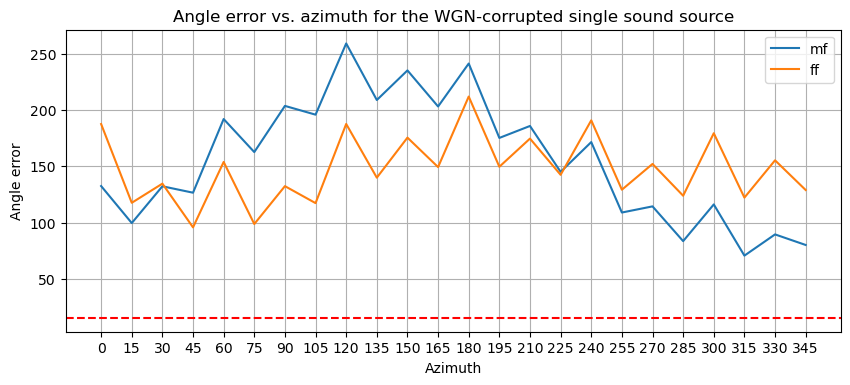

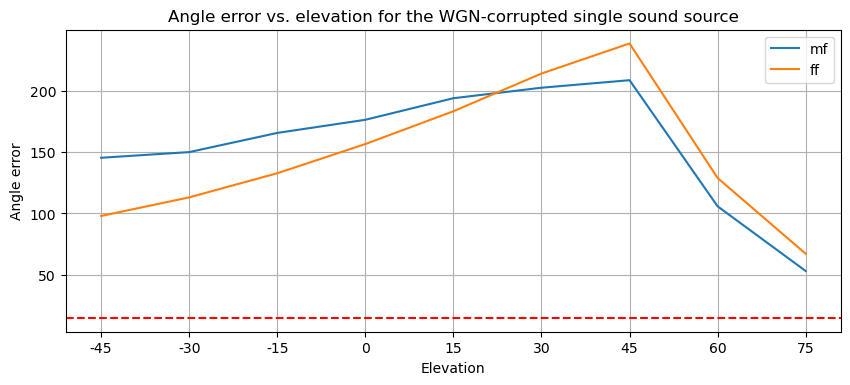

In [20]:
log_dict = {
    "mf": None,
    "mm": None,
    "ff": None,
    "hp": None,
    "lp": None,
    "bp": None,
    "noise": None
}

log_dict["mf"] = pd.read_csv("./test_logs/test_crnn_mf.csv", header=None).iloc[:,:].values.astype(np.float)
log_dict["ff"] = pd.read_csv("./test_logs/test_ff.csv", header=None).iloc[:,:].values.astype(np.float)


fig_azim_src1, ax_azim_src1 = plt.subplots(figsize=(10, 4), dpi=100)
fig_elev_src1, ax_elev_src1 = plt.subplots(figsize=(10, 4), dpi=100)
fig_azim_src2, ax_azim_src2 = plt.subplots(figsize=(10, 4), dpi=100)
fig_elev_src2, ax_elev_src2 = plt.subplots(figsize=(10, 4), dpi=100)
fig_azim_both, ax_azim_both = plt.subplots(figsize=(10, 4), dpi=100)
fig_elev_both, ax_elev_both = plt.subplots(figsize=(10, 4), dpi=100)

for dict_idx in ["mf", "ff"]:
    loss_heatmap_src1 = np.zeros((9,24))
    count_src1 = np.zeros((9,24))
    loss_heatmap_src2 = np.zeros((9,24))
    count_src2 = np.zeros((9,24))

    log_array = log_dict[dict_idx]
    for i in range(log_array.shape[0]):
        if elevOffset(log_array[i,4]) == 9 or elevOffset(log_array[i,6]) == 9:
            # print(f"skip: {log_array[i,4], log_array[i,6]}")
            continue

        loss_heatmap_src1[elevOffset(log_array[i,4]), azimOffset(log_array[i,5])] \
            += log_array[i, 8]
        count_src1[elevOffset(log_array[i,4]), azimOffset(log_array[i,5])] += 1

        loss_heatmap_src2[elevOffset(log_array[i,6]), azimOffset(log_array[i,7])] \
            += log_array[i, 9]
        count_src2[elevOffset(log_array[i,6]), azimOffset(log_array[i,7])] += 1

    loss_heatmap_src1 = np.divide(
        loss_heatmap_src1, count_src1, out=np.zeros_like(loss_heatmap_src1), where=np.absolute(count_src1)!=0
    )
    loss_heatmap_src2 = np.divide(
        loss_heatmap_src2, count_src2, out=np.zeros_like(loss_heatmap_src2), where=np.absolute(count_src2)!=0
    )


    loss_heatmap_total = loss_heatmap_src1 + loss_heatmap_src2
    # vis_heatmap(loss_heatmap_src1, fig_title="Source 1 error heat map")
    # vis_heatmap(loss_heatmap_src2, fig_title="Source 2 error heat map")
    # vis_heatmap(loss_heatmap_total, fig_title="Two-source error heat map")


    loss_azim_src1 = np.mean(loss_heatmap_src1, 0)
    loss_elev_src1 = np.mean(loss_heatmap_src1, 1)

    # vis_line(loss_azim_src1, x_label="Azimuth", fig_title="Loss of source 1 vs. azimuth")
    # vis_line(loss_elev_src1, x_label="Elevation", fig_title="Loss of source 1 vs. elevation")

    ax_azim_src1.plot(loss_azim_src1, label=dict_idx)
    ax_elev_src1.plot(loss_elev_src1, label=dict_idx)

    loss_azim_src2 = np.mean(loss_heatmap_src2, 0)
    loss_elev_src2 = np.mean(loss_heatmap_src2, 1)

    # vis_line(loss_azim_src2, x_label="Azimuth", fig_title="Loss of source 2 vs. azimuth")
    # vis_line(loss_elev_src2, x_label="Elevation", fig_title="Loss of source 2 vs. elevation")
    
    ax_azim_src2.plot(loss_azim_src2, label=dict_idx)
    ax_elev_src2.plot(loss_elev_src2, label=dict_idx)

    loss_total = loss_heatmap_src1 + loss_heatmap_src2
    loss_azim_total = np.mean(loss_total, 0)
    loss_elev_total = np.mean(loss_total, 1)

    # vis_line(loss_azim_total, x_label="Azimuth", fig_title="Loss of both sources vs. azimuth")
    # vis_line(loss_elev_total, x_label="Elevation", fig_title="Loss of both sources vs. elevation")

    ax_azim_both.plot(loss_azim_total, label=dict_idx)
    ax_elev_both.plot(loss_elev_total, label=dict_idx)

for ax in [ax_azim_src1, ax_azim_src2, ax_azim_both, ax_elev_src1, ax_elev_src2, ax_elev_both]:
    ax.legend()
    ax.grid()

x_ticks = range(0,360,15)
ax_azim_both.set_xticks(range(loss_azim_src1.size))
ax_azim_both.set_xticklabels(x_ticks)
x_ticks = range(-45,90,15)
ax_elev_both.set_xticks(range(loss_elev_src1.size))
ax_elev_both.set_xticklabels(x_ticks)
ax_azim_both.axhline(y=15, color='r', linestyle='--', label='Reference to location resolution')
ax_elev_both.axhline(y=15, color='r', linestyle='--', label='Reference to location resolution')
# ax_azim_both.xlabel("Azimuth")
# ax_elev_both.xticks(range(loss_elev_src1.size), x_ticks)
# ax_elev_both.xlabel("Elevation")
# ax.ylabel("Angle error")
ax_azim_both.set_xlabel("Azimuth")
ax_elev_both.set_xlabel("Elevation")
ax_azim_both.set_ylabel("Angle error")
ax_elev_both.set_ylabel("Angle error")
ax_azim_both.set_title("Angle error vs. azimuth for the WGN-corrupted single sound source")
ax_elev_both.set_title("Angle error vs. elevation for the WGN-corrupted single sound source")

In [11]:
log_csv = pd.read_csv("./test_logs/test_crnn_mf.csv", header=None)

loss_heatmap_src1 = np.zeros((9,24))
count_src1 = np.zeros((9,24))
loss_heatmap_src2 = np.zeros((9,24))
count_src2 = np.zeros((9,24))

log_array = (log_csv.iloc[:,:].values.astype(np.float))
print(log_array.shape)

(32560, 10)


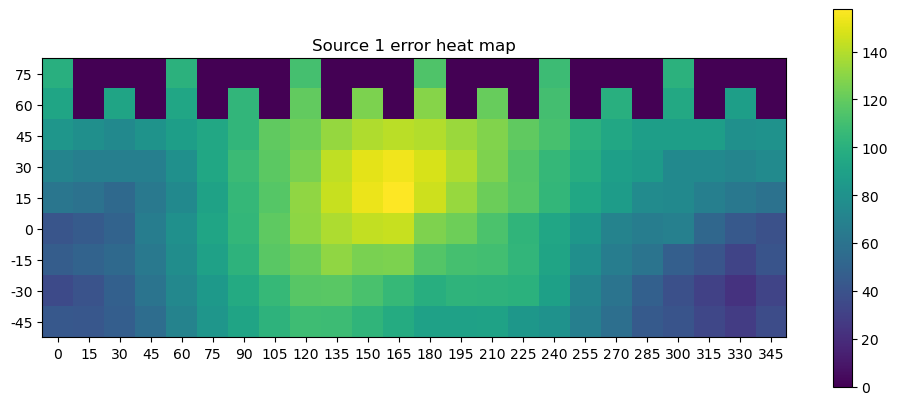

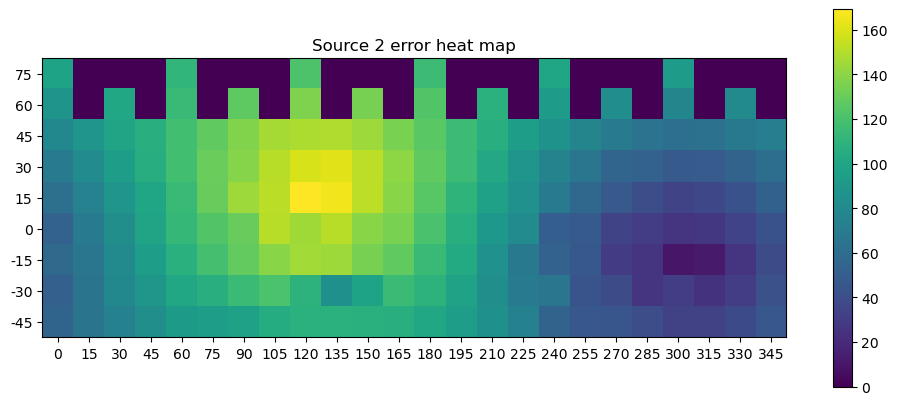

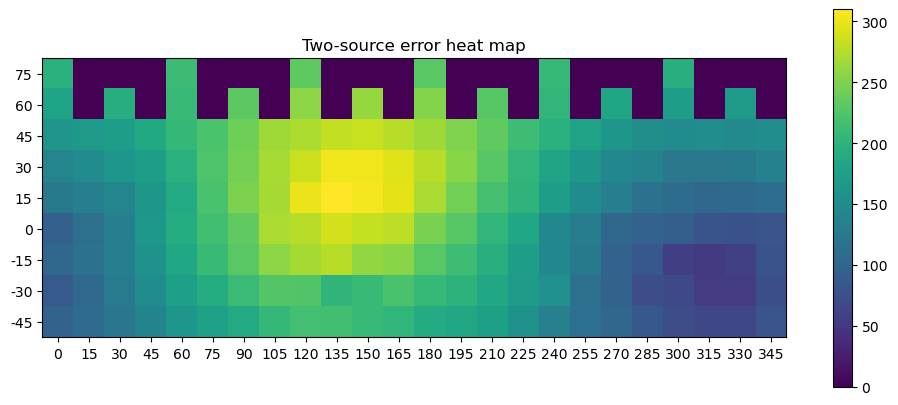

In [12]:
for i in range(log_array.shape[0]):
    if elevOffset(log_array[i,4]) == 9 or elevOffset(log_array[i,6]) == 9:
        # print(f"skip: {log_array[i,4], log_array[i,6]}")
        continue

    loss_heatmap_src1[elevOffset(log_array[i,4]), azimOffset(log_array[i,5])] \
        += log_array[i, 8]
    count_src1[elevOffset(log_array[i,4]), azimOffset(log_array[i,5])] += 1

    loss_heatmap_src2[elevOffset(log_array[i,6]), azimOffset(log_array[i,7])] \
        += log_array[i, 9]
    count_src2[elevOffset(log_array[i,6]), azimOffset(log_array[i,7])] += 1

loss_heatmap_src1 = np.divide(
    loss_heatmap_src1, count_src1, out=np.zeros_like(loss_heatmap_src1), where=np.absolute(count_src1)!=0
)
loss_heatmap_src2 = np.divide(
    loss_heatmap_src2, count_src2, out=np.zeros_like(loss_heatmap_src2), where=np.absolute(count_src2)!=0
)


loss_heatmap_total = loss_heatmap_src1 + loss_heatmap_src2
vis_heatmap(loss_heatmap_src1, fig_title="Source 1 error heat map")
vis_heatmap(loss_heatmap_src2, fig_title="Source 2 error heat map")
vis_heatmap(loss_heatmap_total, fig_title="Two-source error heat map")

(9, 24)


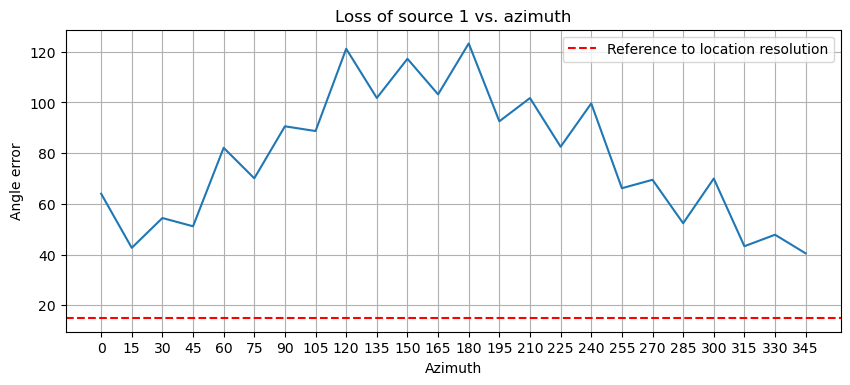

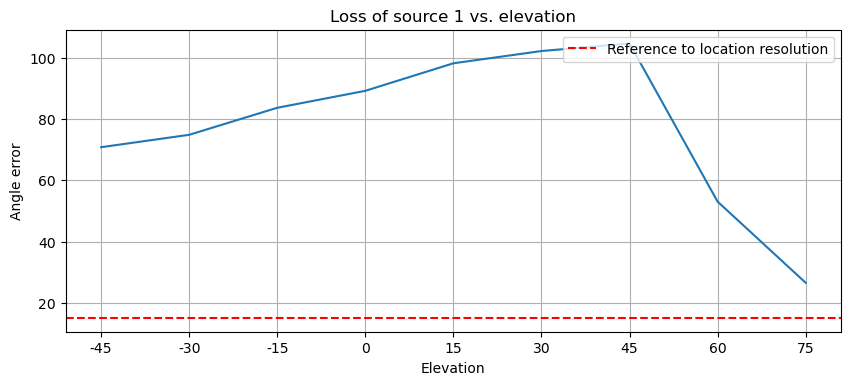

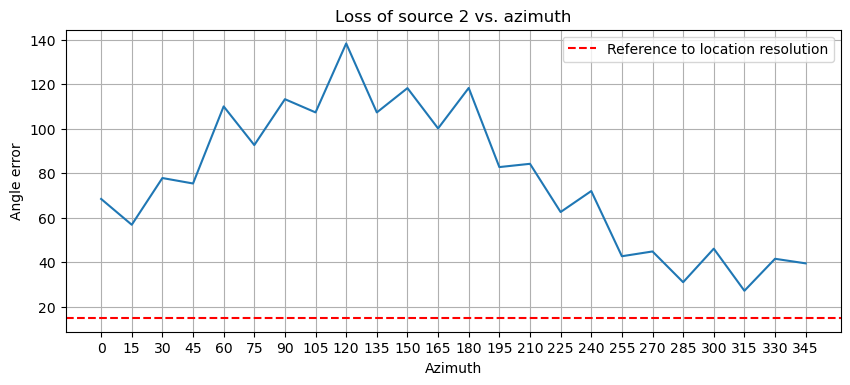

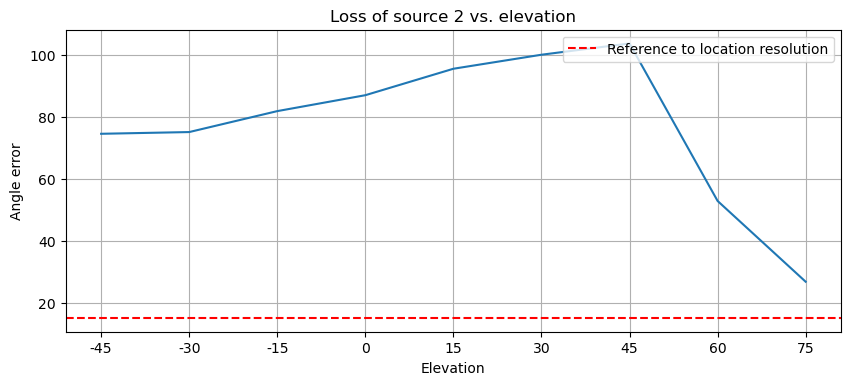

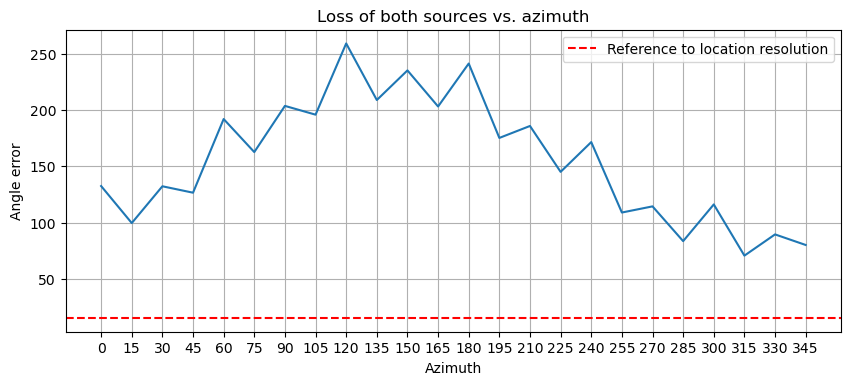

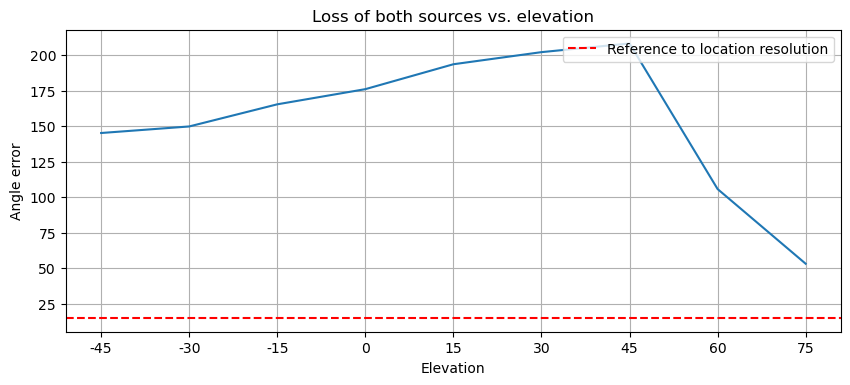

In [13]:
print(loss_heatmap_src1.shape)

loss_azim_src1 = np.mean(loss_heatmap_src1, 0)
loss_elev_src1 = np.mean(loss_heatmap_src1, 1)

vis_line(loss_azim_src1, x_label="Azimuth", fig_title="Loss of source 1 vs. azimuth")
vis_line(loss_elev_src1, x_label="Elevation", fig_title="Loss of source 1 vs. elevation")

loss_azim_src2 = np.mean(loss_heatmap_src2, 0)
loss_elev_src2 = np.mean(loss_heatmap_src2, 1)

vis_line(loss_azim_src2, x_label="Azimuth", fig_title="Loss of source 2 vs. azimuth")
vis_line(loss_elev_src2, x_label="Elevation", fig_title="Loss of source 2 vs. elevation")

loss_total = loss_heatmap_src1 + loss_heatmap_src2
loss_azim_total = np.mean(loss_total, 0)
loss_elev_total = np.mean(loss_total, 1)

vis_line(loss_azim_total, x_label="Azimuth", fig_title="Loss of both sources vs. azimuth")
vis_line(loss_elev_total, x_label="Elevation", fig_title="Loss of both sources vs. elevation")

In [59]:
loss_heatmap_total[:,].sum(0)
np.true_divide(loss_heatmap_src1[:,].sum(1),(total_loss!=0).sum(1))

array([ 9.23560459, 24.50617958,         nan, 25.02330672, 15.91912663,
       20.57460256, 21.15629679, 13.75922964,         nan,         nan])

In [73]:
np.argwhere(np.isnan(loss_heatmap_total[:,].sum(1)))
print(loss_heatmap_total[:,3])

[  0.45799551 115.94430531   0.         110.07090953  60.56604677
  41.56082342  41.46610577   0.           0.           0.        ]


# Prediction vs Ground Truth

In [ ]:

sphericalWrap(log_array[:,0:2])
print(log_array[:,0:2][log_array[:,0:2][:,0]<-45])
print(log_array[:,0:2][log_array[:,0:2][:,0]>90])
print(log_array[:,0:2][log_array[:,0:2][:,1]<0])
print(log_array[:,0:2][log_array[:,0:2][:,1]>=360])
vis_prediction(log_array[:187,0:2], log_array[:187,4:6], log_array[:187,8])

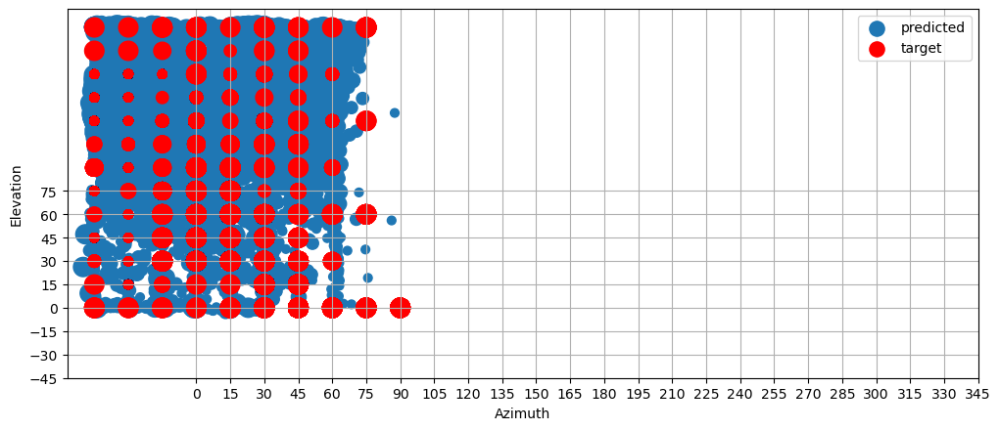

In [113]:
vis_prediction(log_array[:,0:2], log_array[:,4:6], log_array[:,8])

# Frequency-limited

In [3]:
from glob import glob
from scipy import signal
from data_loader import AudioSignal

speech_male_path = glob("./audio_test/speech_male/*")

speech_male = AudioSignal(path=speech_male_path[0], slice_duration=1)

print(speech_male.sig.shape)


(225600,)


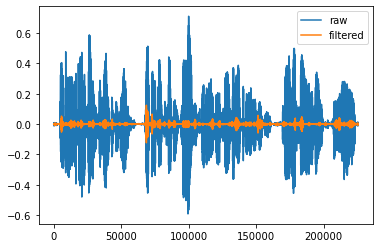

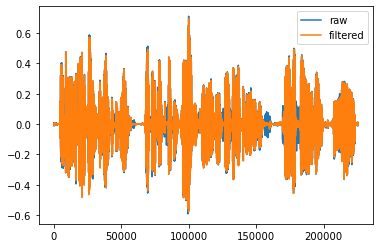

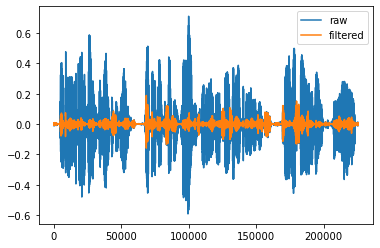

In [13]:
def band_pass(sig, f_low, f_high, fs):
    b, a = signal.butter(N=6, Wn=[2*f_low/fs, 2*f_high/fs], btype='band')
    w, h = signal.freqs(b, a)
    # plt.semilogx(w, 20 * np.log10(abs(h)))
    filtered = signal.lfilter(b, a, sig)
    plt.plot(sig)
    plt.plot(filtered)
    plt.legend(["raw","filtered"])
    plt.show()
    plt.close()
    return filtered

def low_pass(sig, f_low, fs):
    b, a = signal.butter(N=6, Wn=2*f_low/fs, btype='lowpass')
    w, h = signal.freqs(b, a)
    # plt.semilogx(w, 20 * np.log10(abs(h)))
    filtered = signal.lfilter(b, a, sig)
    plt.plot(sig)
    plt.plot(filtered)
    plt.legend(["raw","filtered"])
    plt.show()
    plt.close()
    return filtered

def high_pass(sig, f_high, fs):
    b, a = signal.butter(N=6, Wn=2*f_high/fs, btype='highpass')
    w, h = signal.freqs(b, a)
    # plt.semilogx(w, 20 * np.log10(abs(h)))
    filtered = signal.lfilter(b, a, sig)
    plt.plot(sig)
    plt.plot(filtered)
    plt.legend(["raw","filtered"])
    plt.show()
    plt.close()
    return filtered


sig_bp = band_pass(speech_male.sig, f_low=1400, f_high=1800, fs=speech_male.fs_audio)
sig_lp = low_pass(speech_male.sig, f_low=1400, fs=speech_male.fs_audio)
sig_hp = high_pass(speech_male.sig, f_high=1400, fs=speech_male.fs_audio)



In [17]:
from scipy.io.wavfile import write

def writeAudio(sig, fs, file_name="test"):
    scaled = np.int16(sig/np.max(np.abs(sig)) * 32767)
    write(file_name+'.wav', fs, scaled)

writeAudio(sig_bp, fs=speech_male.fs_audio, file_name="test_bp")
writeAudio(sig_lp, fs=speech_male.fs_audio, file_name="test_lp")
writeAudio(sig_hp, fs=speech_male.fs_audio, file_name="test_hp")

In [8]:
from playsound import playsound

playsound("test.wav")